In [1]:
import numpy as np
import pandas as pd
import scanpy as sc


In [2]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')

/Users/siqizhao/miniconda3/envs/scwork/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


scanpy==1.9.1 anndata==0.8.0 umap==0.5.2 numpy==1.21.2 scipy==1.8.0 pandas==1.4.2 scikit-learn==1.0.2 statsmodels==0.13.2 python-igraph==0.9.9 pynndescent==0.5.6


### Read in data

In [3]:
adata_1 = sc.read_10x_mtx(
    './matrix_r1/',  # the directory with the `.mtx` file
    var_names='gene_symbols',                # use gene symbols for the variable names (variables-axis index)
    cache=True)  
adata_2 = sc.read_10x_mtx(
    './matrix_r2/',  # the directory with the `.mtx` file
    var_names='gene_symbols',                # use gene symbols for the variable names (variables-axis index)
    cache=True)  

... reading from cache file cache/matrix_r1-matrix.h5ad
... reading from cache file cache/matrix_r2-matrix.h5ad


In [4]:
adata= adata_1.concatenate(adata_2, batch_key='rep')

/Users/siqizhao/miniconda3/envs/scwork/lib/python3.9/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],


In [5]:
clones = pd.read_csv('./220329_cell_clone_info.csv')

In [6]:
# Change the clone data to 
clones[['cellBC_rew', 'rep']] = clones['cellBC'].str.split('-', expand=True)

In [7]:
clones['cellBC_rew'] =  clones['cellBC_rew'].mask(clones['rep'].eq('1'), clones['cellBC_rew']+ '-1-0')
clones['cellBC_rew'] =  clones['cellBC_rew'].mask(clones['rep'].eq('2'), clones['cellBC_rew']+ '-1-1')

In [8]:
clones_info = clones[['cellBC_rew', 'clone']]

In [9]:
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)

filtered out 35 cells that have less than 200 genes expressed
filtered out 15105 genes that are detected in less than 3 cells


In [10]:
adata.var['mt'] = adata.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

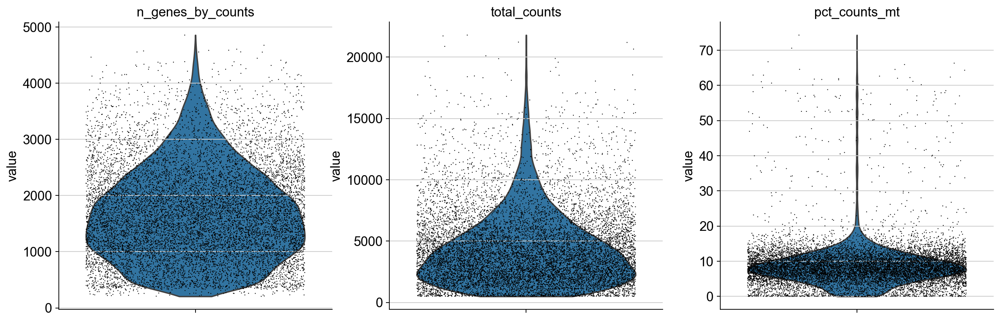

In [11]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

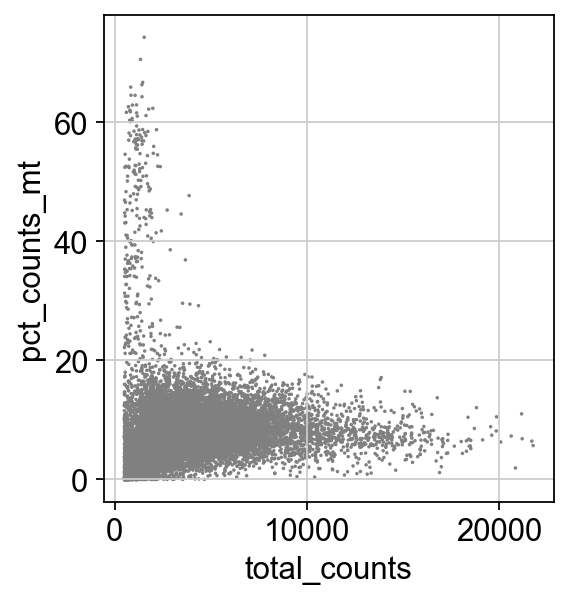

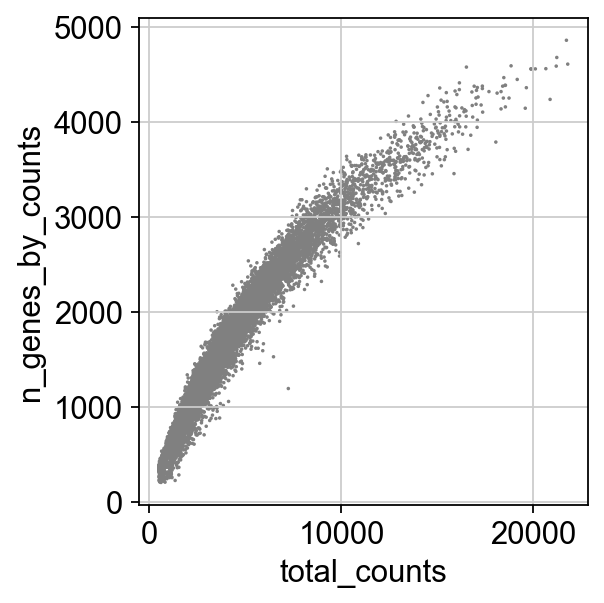

In [12]:
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

In [13]:
#adata = adata[adata.obs.total_counts < 60000, :]
adata = adata[adata.obs.pct_counts_mt < 20, :]

In [14]:
sc.pp.normalize_total(adata, exclude_highly_expressed=True, target_sum=1e6)

/Users/siqizhao/miniconda3/envs/scwork/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


normalizing counts per cell The following highly-expressed genes are not considered during normalization factor computation:
['TXNIP', 'RPS18', 'HBG1', 'HBG2', 'PRG2', 'FTH1', 'MALAT1', 'HSP90B1', 'HBZ', 'MT2A', 'FTL', 'TIMP1']
    finished (0:00:00)


In [15]:
sc.pp.log1p(adata)

In [16]:
sc.pp.highly_variable_genes(adata, min_mean=0.01, max_mean=15, min_disp=0.01)

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


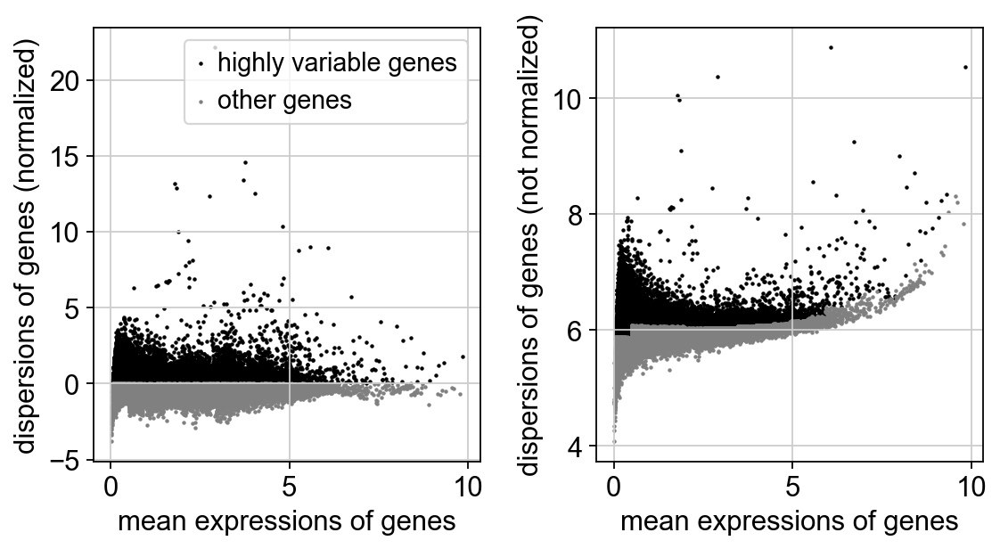

In [17]:
sc.pl.highly_variable_genes(adata)

In [18]:
adata.raw = adata

In [19]:
adata = adata[:, adata.var.highly_variable]

In [20]:
#sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'])

In [21]:
sc.tl.pca(adata, svd_solver='arpack')

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:04)


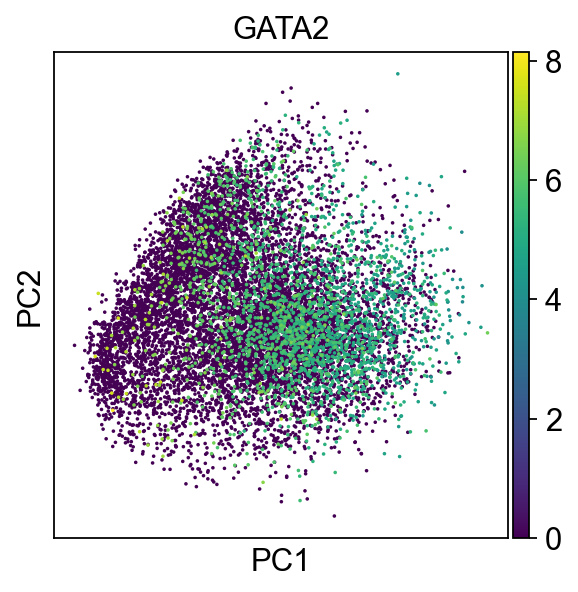

In [22]:
sc.pl.pca(adata, color = 'GATA2')

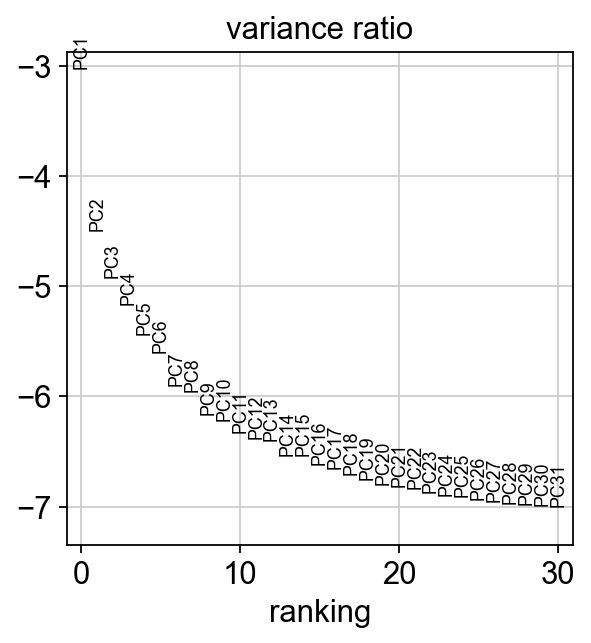

In [23]:
sc.pl.pca_variance_ratio(adata, log=True)

In [52]:
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=11, random_state=1)

computing neighbors
    using 'X_pca' with n_pcs = 11
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)


In [53]:
sc.tl.umap(adata, random_state=1)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:04)


In [58]:
sc.tl.leiden(adata, resolution = 0.3, key_added='clusters', random_state=1)

running Leiden clustering
    finished: found 5 clusters and added
    'clusters', the cluster labels (adata.obs, categorical) (0:00:01)


[<AxesSubplot:title={'center':'clusters'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:title={'center':'HBG2'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:title={'center':'GATA2'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:title={'center':'CD24'}, xlabel='UMAP1', ylabel='UMAP2'>]

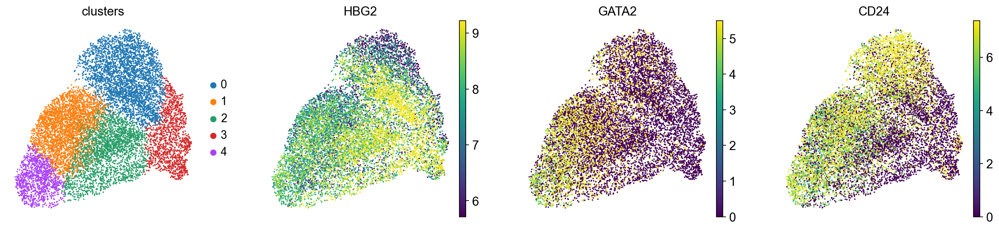

In [60]:
sc.pl.umap(adata, color=[ 'clusters', 'HBG2', 'GATA2', 'CD24'],frameon=False, show=False, vmin = 'p10', vmax = 'p90')

In [61]:
old_to_new = {'0':'CD24','1':'CD24','2': 'Diff','3':'Diff','4':'CD24'}
adata.obs['manual'] =  adata.obs['clusters'].map(old_to_new).astype('category')

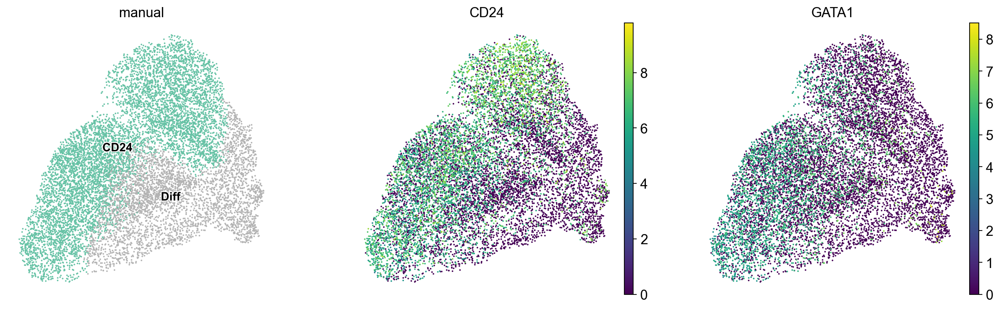

In [72]:
import matplotlib.pyplot as plt
from matplotlib.pyplot import rc_context
with rc_context({'figure.figsize': (5, 5)}):
    fig = sc.pl.umap(adata, color=['manual', 'CD24', 'GATA1'], legend_loc='on data',
               legend_fontsize=12, legend_fontoutline=2,frameon=False, palette='Set2', show = False)
    plt.savefig('220419_ce24_cells.pdf', dpi = 300)

In [68]:
adata.obs['manual'].to_csv('./220419_stemness_cluster.csv')

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


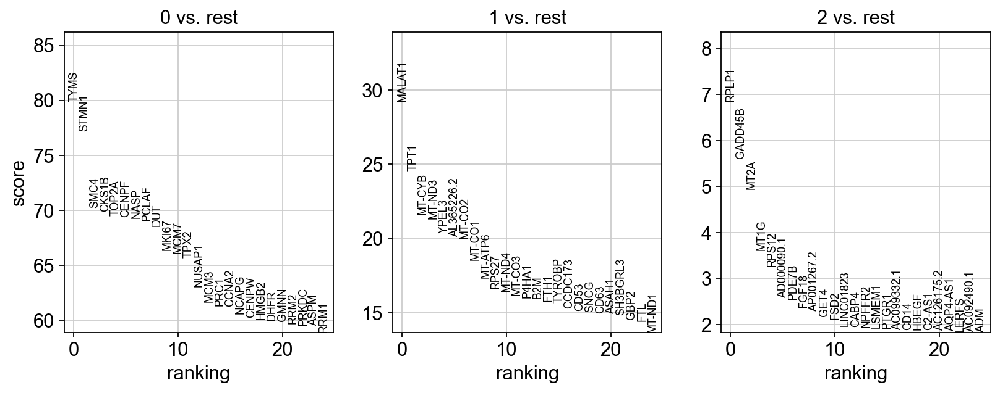

In [92]:
sc.tl.rank_genes_groups(adata, 'clusters', method='t-test')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

In [93]:
clones_info = clones_info.rename(columns={'cellBC_rew': 'cellBC'})

In [94]:
cell_list = adata.obs.index.tolist()
cell_list = pd.DataFrame(cell_list, columns=['cellBC'])
ordered_label = pd.merge(cell_list, clones_info, on='cellBC', how = 'left')

In [95]:
labels = ordered_label.clone.to_list()

In [96]:
adata.obs['clones'] = labels

/Users/siqizhao/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'clones' as categorical


[<AxesSubplot:title={'center':'clusters'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:title={'center':'clones'}, xlabel='UMAP1', ylabel='UMAP2'>]

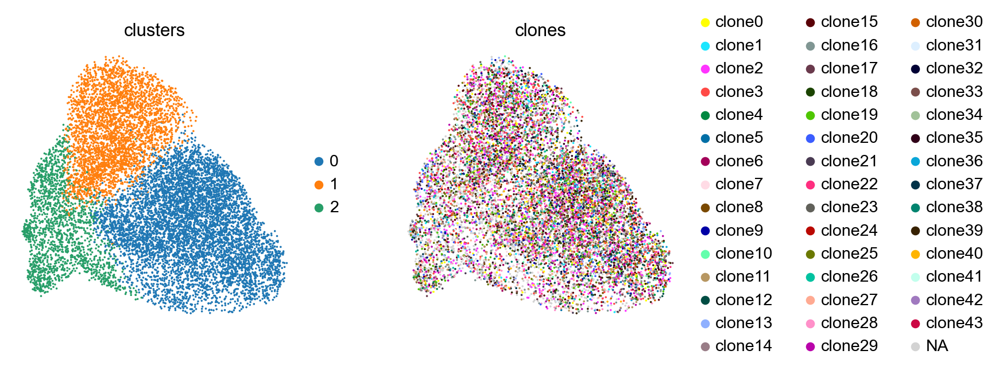

In [97]:
sc.pl.umap(adata, color=[ 'clusters', 'clones'],frameon=False, show=False)

In [98]:
clones = clones_info['clone'].unique().tolist()
for clone in clones:
    if clone != 'nan':
        print(clone)
        adata.obs[clone] = adata.obs['clones'].eq(clone)
        adata.obs[clone] = np.where(adata.obs[clone] == True, clone, 'nan')

clone20
clone11
clone39
clone31
clone28
clone16
clone4
clone41
clone27
clone29
clone8
clone21
clone22
clone7
clone0
clone5
clone2
clone24
clone36
clone3
clone40
clone9
clone35
clone14
clone17
clone15
clone25
clone23
clone42
clone12
clone19
clone32
clone6
clone34
clone43
clone13
clone1
clone38
clone26
clone18
clone30
clone33
clone10
clone37


In [99]:
clones.extend(['clusters','CD24', 'PRAME', 'WT1'])

/Users/siqizhao/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'clone20' as categorical
/Users/siqizhao/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'clone11' as categorical
/Users/siqizhao/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reord

[<AxesSubplot:title={'center':'clone20'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:title={'center':'clone11'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:title={'center':'clone39'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:title={'center':'clone31'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:title={'center':'clone28'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:title={'center':'clone16'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:title={'center':'clone4'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:title={'center':'clone41'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:title={'center':'clone27'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:title={'center':'clone29'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:title={'center':'clone8'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:title={'center':'clone21'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:title={'center':'clone22'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:title={'cente

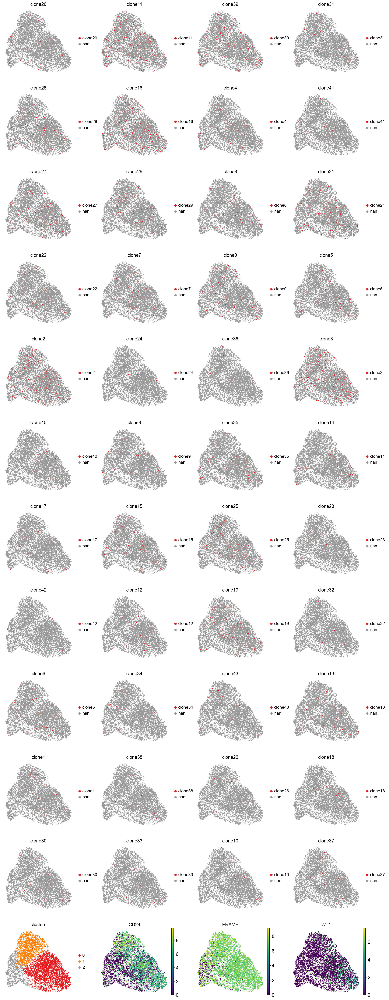

In [100]:
#sc.pl.umap(adata, color = clones, palette='Set1', frameon=False, show=False)

computing density on 'umap'
--> added
    'umap_density_clone20', densities (adata.obs)
    'umap_density_clone20_params', parameter (adata.uns)


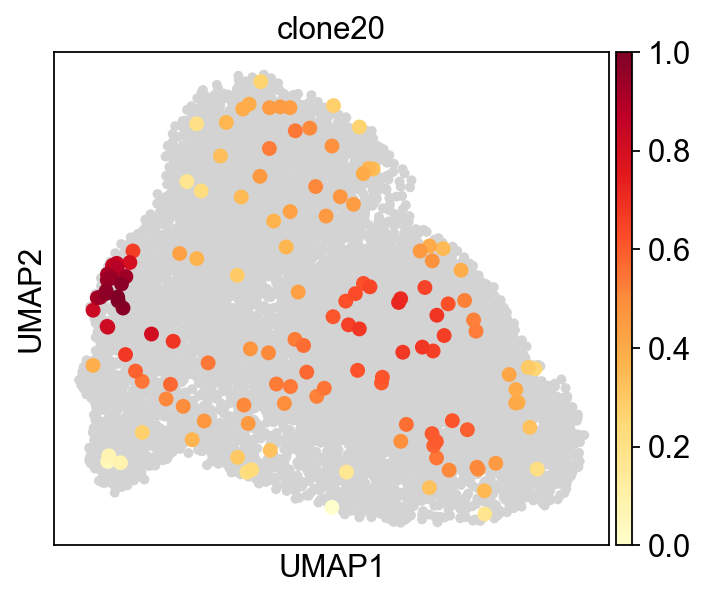

In [102]:
sc.tl.embedding_density(adata, basis='umap', groupby='clone20')
sc.pl.embedding_density(adata, basis='umap', key='umap_density_clone20', group = 'clone20')

computing density on 'umap'
--> added
    'umap_density_clone42', densities (adata.obs)
    'umap_density_clone42_params', parameter (adata.uns)


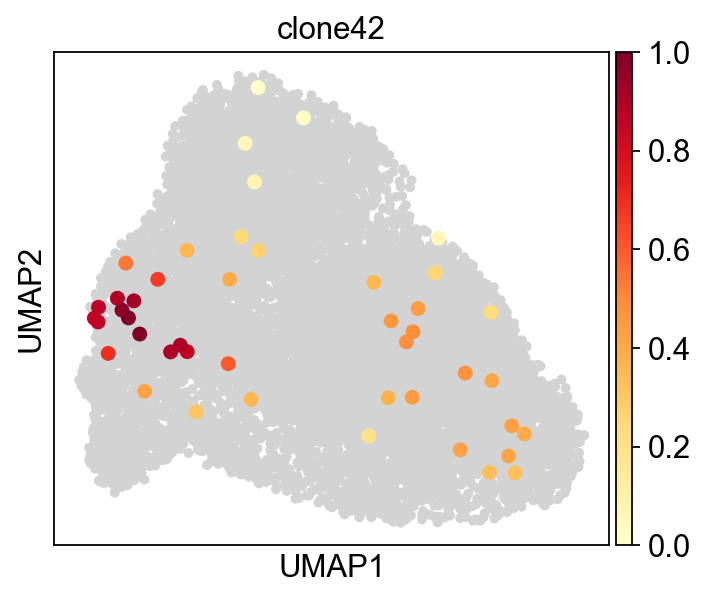

In [103]:
sc.tl.embedding_density(adata, basis='umap', groupby='clone42')
sc.pl.embedding_density(adata, basis='umap', key='umap_density_clone42', group = 'clone42')

computing density on 'umap'
--> added
    'umap_density_clone43', densities (adata.obs)
    'umap_density_clone43_params', parameter (adata.uns)


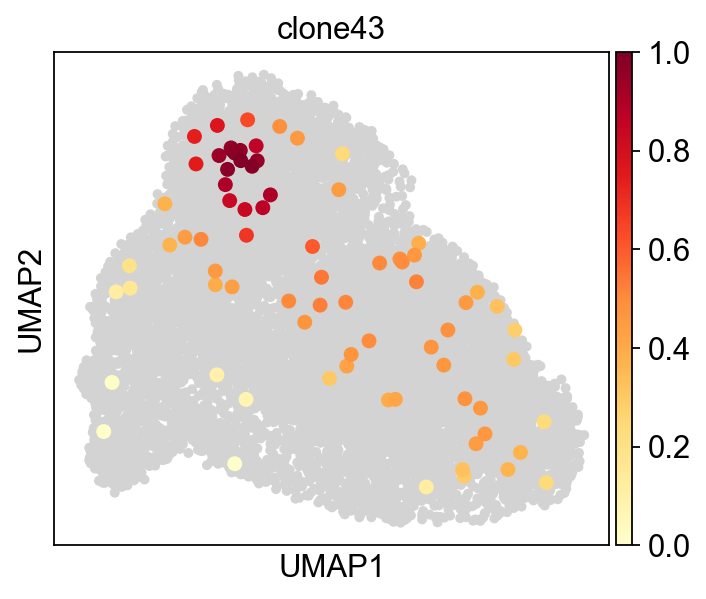

In [104]:
sc.tl.embedding_density(adata, basis='umap', groupby='clone43')
sc.pl.embedding_density(adata, basis='umap', key='umap_density_clone43', group = 'clone43')

computing density on 'umap'
--> added
    'umap_density_clone1', densities (adata.obs)
    'umap_density_clone1_params', parameter (adata.uns)


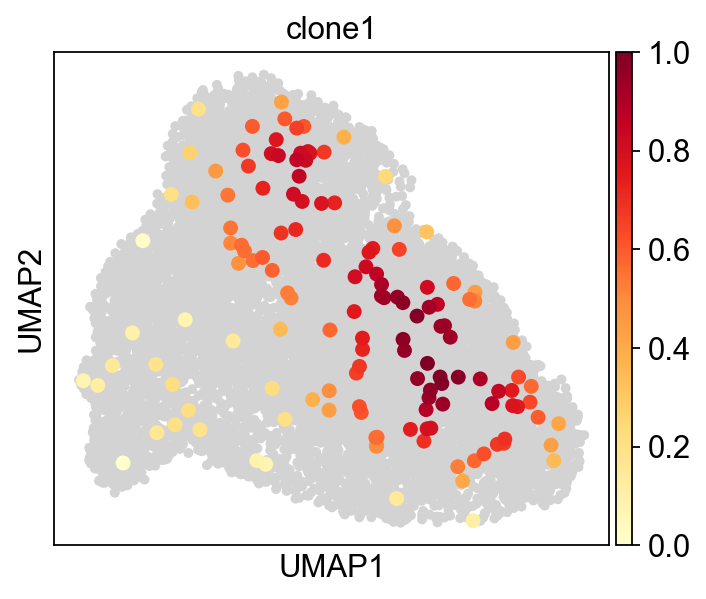

In [106]:
sc.tl.embedding_density(adata, basis='umap', groupby='clone1')
sc.pl.embedding_density(adata, basis='umap', key='umap_density_clone1', group = 'clone1')